# Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mp
import warnings
warnings.filterwarnings("ignore")
import plotly.graph_objs as go
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.metrics import roc_curve, roc_auc_score


#Reading the CSV data:

In [ ]:
#Reading the CSV data:

df = pd.read_csv('crime_update.csv')
df.head(5)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Prefix,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location
0,201202980,3550,180042096,8/23/2018 21:52,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,MIDDLEBROOK,NaN,RD,8/23/2018 21:52,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)"
1,201181293,3522,180015424,3/30/2018 1:00,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,3/30/2018 1:01,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
2,201181293,3562,180015424,3/30/2018 1:00,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,3/30/2018 1:01,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
3,201193163,3520,180029476,6/14/2018 22:26,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,NaN,QUINCE ORCHARD,NaN,RD,6/14/2018 22:26,6/15/2018 3:00,39.147954,-77.218189,6D,"(39.148, -77.2182)"
4,201204355,2204,180043926,9/3/2018 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,NaN,FALSTONE,NaN,AVE,9/2/2018 23:30,9/3/2018 0:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)"


In [ ]:
df.shape

(305906, 29)

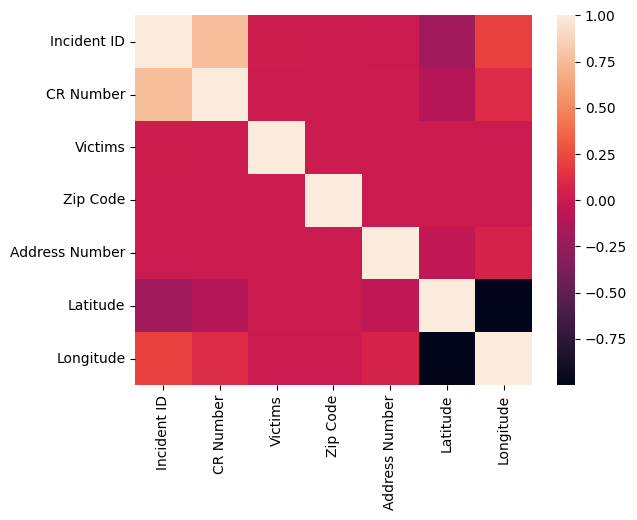

In [ ]:
sns.heatmap(df.corr())
plt.show()

#Checking the null values in the dataset



In [ ]:
#Checking the null values in the dataset

df.isnull().sum()

Incident ID                    0
Offence Code                   0
CR Number                      0
Dispatch Date / Time       48892
NIBRS Code                     0
Victims                        0
Crime Name1                  272
Crime Name2                  272
Crime Name3                  272
Police District Name          94
City                        1276
State                          0
Zip Code                    3165
Agency                         0
Place                          0
Sector                      1527
Beat                        1527
PRA                          237
Address Number             26081
Street Prefix             292278
Street Name                    1
Street Suffix             300474
Street Type                  339
Start_Date_Time                0
End_Date_Time             161515
Latitude                       0
Longitude                      0
Police District Number         0
Location                       0
dtype: int64

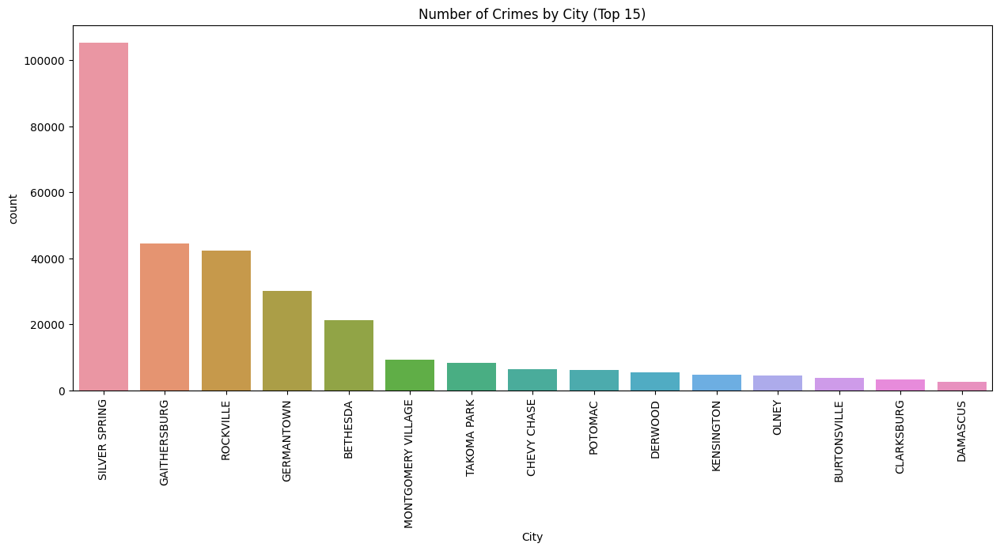

In [ ]:
# Exploratory data analysis, finding the cities with comparatively high crime

plt.figure(figsize=(15,6))
sns.countplot(x='City', data=df, order=df['City'].value_counts().iloc[:15].index)
plt.xticks(rotation=90)
plt.title('Number of Crimes by City (Top 15)')
plt.show()

In [ ]:
len(df.index)

305906

#Data Cleaning

In [ ]:
#Removing the null values:
df = df.dropna(subset=['City'])

In [ ]:
#Null values in "City" column removed:
df.isnull().sum()

Incident ID                    0
Offence Code                   0
CR Number                      0
Dispatch Date / Time       48735
NIBRS Code                     0
Victims                        0
Crime Name1                  272
Crime Name2                  272
Crime Name3                  272
Police District Name          79
City                           0
State                          0
Zip Code                    3136
Agency                         0
Place                          0
Sector                      1522
Beat                        1522
PRA                          236
Address Number             25973
Street Prefix             291004
Street Name                    0
Street Suffix             299609
Street Type                  337
Start_Date_Time                0
End_Date_Time             161034
Latitude                       0
Longitude                      0
Police District Number         0
Location                       0
dtype: int64

In [ ]:
#Defining Bad areas

bad_areas = ['SILVER SPRING',
'GAITHERSBURG'
'ROCKVILLE',
'GERMANTOWN',
'BETHESDA',
'MONTGOMERY VILLAGE',
'TAKOMA PARK',
'CHEVY CHASE',
'POTOMAC',
'DERWOOD',
'KENSINGTON',
'OLNEY',
'BURTONSVILLE',
'CLARKSBURG'
]
print(bad_areas)

['SILVER SPRING', 'GAITHERSBURGROCKVILLE', 'GERMANTOWN', 'BETHESDA', 'MONTGOMERY VILLAGE', 'TAKOMA PARK', 'CHEVY CHASE', 'POTOMAC', 'DERWOOD', 'KENSINGTON', 'OLNEY', 'BURTONSVILLE', 'CLARKSBURG']


In [ ]:
#Creating a new column based on Bad areas list to categorize the locations into "Safe" & "Not Safe" zones:
 
df['Zone_status'] = df['City'].isin(bad_areas)
df['Zone_status'] = df['Zone_status'].map({True: 'Not Safe', False: 'Safe'})
df.head(5)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Zone_status
0,201202980,3550,180042096,8/23/2018 21:52,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,MIDDLEBROOK,NaN,RD,8/23/2018 21:52,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",Not Safe
1,201181293,3522,180015424,3/30/2018 1:00,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,WOODMONT,NaN,AVE,3/30/2018 1:01,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",Not Safe
2,201181293,3562,180015424,3/30/2018 1:00,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,WOODMONT,NaN,AVE,3/30/2018 1:01,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",Not Safe
3,201193163,3520,180029476,6/14/2018 22:26,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,QUINCE ORCHARD,NaN,RD,6/14/2018 22:26,6/15/2018 3:00,39.147954,-77.218189,6D,"(39.148, -77.2182)",Safe
4,201204355,2204,180043926,9/3/2018 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,FALSTONE,NaN,AVE,9/2/2018 23:30,9/3/2018 0:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)",Not Safe


In [ ]:
#Checking the counts
count=df['Zone_status'].value_counts()['Safe']
count_safe=df['Zone_status'].value_counts()['Not Safe']
print(f'Not safe instances = {count}.')
print(f'Safe instances = {count_safe}.')

Not safe instances = 95407.
Safe instances = 209223.


In [ ]:

# create a bar chart using Plotly Express
fig = px.histogram(df, x='Zone_status', color='Zone_status', 
                   title='Counts of "Safe" and "Not Safe"')

# show the chart
fig.show()

#Scatter plot of Crimes in different states

In [ ]:
fig = go.Figure(data=go.Scatter(x=df['State'], y=df['Zone_status'], mode='markers',
                                 marker=dict(size=10, color=df['Zone_status'].map({'Safe': 'green', 'Not Safe': 'red'})),
                                 text=df['Zone_status']))

fig.update_layout(title='Scatter Plot of Safe/Not Safe Values by State',
                  xaxis_title='State', yaxis_title='Safety status')

In [ ]:
df.to_csv("final_file.csv",index=False)

#Random forest 

In [ ]:


# read the dataset
df = pd.read_csv('final_file.csv')

# select the features and target variable
X = df[['Offence Code', 'Police District Number', 'Latitude', 'Longitude']]
y = df['Zone_status']

# convert categorical features to dummy variables
X = pd.get_dummies(X)

# split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# create a random forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# train the classifier on the training set
clf.fit(X_train, y_train)

# predict the target variable for the test set
y_pred = clf.predict(X_test)

# calculate the accuracy score of the classifier
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of the random forest classifier: {accuracy}")


Accuracy of the random forest classifier: 0.9877556379870662




```
# This is formatted as code
```

#Confusion matrix

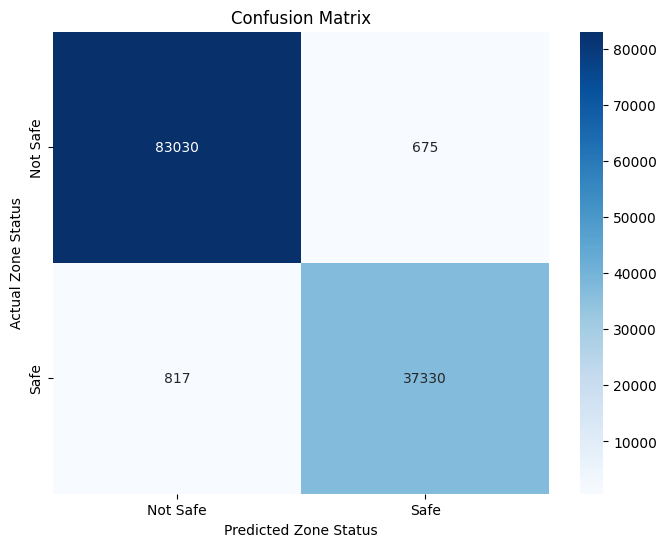

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# create confusion matrix
cm = confusion_matrix(y_test, y_pred)

# create heatmap of confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Zone Status")
plt.ylabel("Actual Zone Status")
plt.show()  


In [ ]:
data = pd.read_csv('crime__update.csv')


#Naive Bayes

In [ ]:
#Naive Bayes implementation

# Load the data
data = pd.read_csv('crime__update.csv')

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data['Agency'], data['Zone_status'], random_state=42)

# Vectorize the data using a CountVectorizer
vectorizer = CountVectorizer()
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Train a Naive Bayes classifier on the training data
clf = MultinomialNB()
clf.fit(X_train, y_train)

# Make predictions on the testing data
predictions = clf.predict(X_test)

# Print the accuracy of the classifier
accuracy = clf.score(X_test, y_test)
print('Accuracy:', accuracy)


Accuracy: 0.7890306993355918


# Confusion matrix (Naive Bayes)



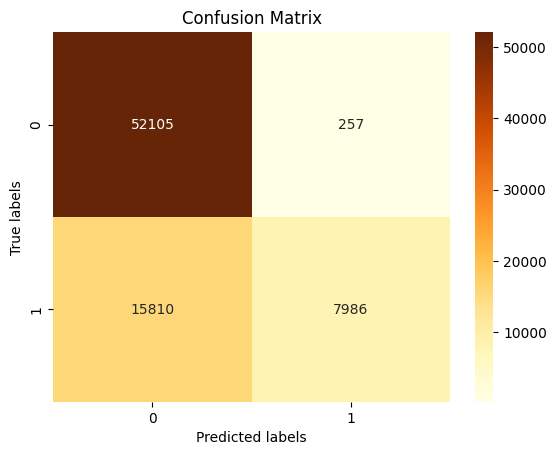

In [ ]:

# Generate a confusion matrix using the predicted and true labels
cmn = confusion_matrix(y_test, predictions)

# Create a heatmap using the confusion matrix
sns.heatmap(cmn, annot=True, fmt='g', cmap='YlOrBr')

# Add labels and title to the heatmap
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Show the plot
plt.show()

#ROC Curve (Naive Bayes)

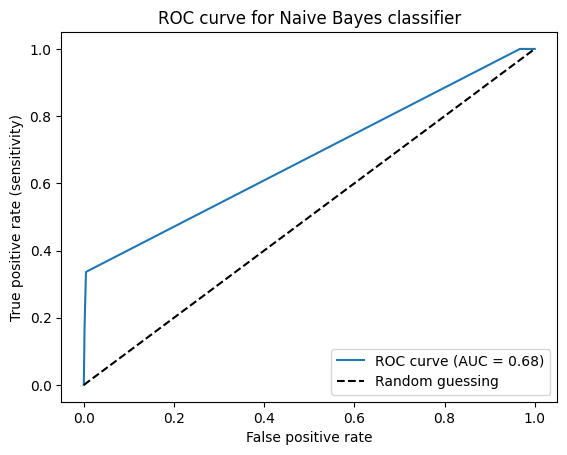

In [ ]:
import matplotlib.pyplot as plt


# Encode the labels as integers
le = LabelEncoder()
y_test = le.fit_transform(y_test)

# Make predictions on the testing data
y_prob = clf.predict_proba(X_test)[:, 1]  # probability estimates for the positive class

# Compute the ROC curve and AUC-ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc_roc = roc_auc_score(y_test, y_prob)

# Plot the ROC curve
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_roc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random guessing')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate (sensitivity)')
plt.title('ROC curve for Naive Bayes classifier')
plt.legend(loc='lower right')
plt.show()
